<a href="https://colab.research.google.com/github/Max-FM/icg_pakistan_innovation_workshop/blob/main/Reading_in_Raster_Images_and_Plotting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Reading in and plotting Raster images using Python

If you are accessing this Colab notebook through the shared Google Drive Folder, you will need to make your own copy by clikcing File -> Save a copy in Drive.

## Connect to Google Drive

If you wish to connect this Colab notebook to Google Drive, such that you can directly access the satellite images on the shared folder follow the instructions below:

1. Click the folder icon in the left sidebar.
2. Click the Google Drive folder icon (the hover text is "Mount Drive").

Or alternatively uncomment and run the below cell:

In [ ]:
# from google.colab import drive
# drive.mount('/gdrive')

## Install rioxarray package

In [ ]:
%%capture

!pip install rioxarray

## Import Required Modules

In [ ]:
import numpy as np
import xarray as xa
import rioxarray as riox

import folium
from folium import plugins
import matplotlib.pyplot as plt
from matplotlib import cm

## Define Functions

In [ ]:
def normalize(array):
    """Normalizes numpy arrays into scale 0.0 - 1.0"""
    array_min, array_max = array.min(), array.max()
    return ((array - array_min)/(array_max - array_min))

def make_composite(band_1, band_2, band_3):
    """Converts three raster bands into a composite image"""
    return normalize(np.dstack((band_1, band_2, band_3)))

def make_rgb_composite(raster):
    """Creates an RGB composite image using the input raster."""
    r = raster[2]
    g = raster[1]
    b = raster[0]

    return make_composite(r, g, b)

def calculate_ndvi(raster):
    """Calculates the normalised difference vegetation index using the input raster."""
    r = raster[2]
    nir = raster[3]

    return (nir - r) / (nir + r)

def calculate_ndwi(raster):
    """Calculates the McFeeters (1996) normalised difference water index using the input raster."""
    g = raster[1]
    nir = raster[3]

    return (g - nir) / (g + nir)

## Importing raster data using rioxarray

The bands for the Sentinel 2 images are (in order) Blue, Green, Red, Near IR, with the final layer containing a cloud probability map. A factor of 10^-4 scaling of the R, G, B and NIR bands is required to obtain true pixel value, as Google Earth Engine image pixel values are stored as integers to save on storage space.

Typically the [Rasterio](https://rasterio.readthedocs.io/en/latest/quickstart.html) package is used to open geoTIFF tiles in Python, however I personally prefer using the [Rioxarray](https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html) package as it enhances the capabilities of Rasterio and includes methods that simplifies a lot of the boilerplate code required when using Rasterio. Rioxarray imports the raster files into a `DataArray` format via the [xarray](http://xarray.pydata.org/en/stable/index.html) package, which is essentially a beefed up version of NumPy, incorporating many features from Pandas and for the most part can be treated like a standard NumPy `array`. Unfortunatley the main drawback of rioxarray over rasterio is a lack of documentation, however the xarray documentation itself is very comphrehensive.

To convert DataArrays to numpy array format simply apply the `.values` attribute on your data as you would when using Pandas.

Also of final note for the Shamshato region I would personally choose only scenes with size > 10MB as these scenes are most likely to be complete.

In [ ]:
base_filepath = "/content/drive/Shareddrives/ICG Data Analytics/Data/Pakistan"

s2_filepath = f"{base_filepath}/Shamshato/2019-04-01/Sentinel_2_SR/20190419T055641_20190419T055917_T42SYC.tif"
DEM_filepath = f"{base_filepath}/Shamshato/shamshato_DEM_10m.tif"

s2_raster = riox.open_rasterio(s2_filepath)[:-1] /10000 # Scaled R, G, B and NIR bands.
cloud_prob_map = riox.open_rasterio(s2_filepath)[-1] # Unscaled cloud probability map.

dem_raster = riox.open_rasterio(DEM_filepath)

display(s2_raster, cloud_prob_map, dem_raster)

<xarray.DataArray (band: 4, y: 1213, x: 1858)>
array([[[0.0393, 0.0393, 0.0403, ..., 0.0357, 0.0349, 0.036 ],
        [0.0336, 0.0336, 0.0328, ..., 0.0332, 0.0367, 0.0391],
        [0.0393, 0.0393, 0.0411, ..., 0.0385, 0.0525, 0.0515],
        ...,
        [0.0591, 0.0599, 0.0599, ..., 0.0365, 0.0345, 0.0395],
        [0.0467, 0.0321, 0.0365, ..., 0.0466, 0.0466, 0.0443],
        [0.0484, 0.0317, 0.0354, ..., 0.0595, 0.0595, 0.0619]],

       [[0.0774, 0.0774, 0.0799, ..., 0.0717, 0.0669, 0.0631],
        [0.0741, 0.0741, 0.0793, ..., 0.0674, 0.0682, 0.0697],
        [0.0735, 0.0735, 0.0741, ..., 0.0662, 0.0847, 0.091 ],
        ...,
        [0.0927, 0.0963, 0.0987, ..., 0.0655, 0.0641, 0.0661],
        [0.0759, 0.081 , 0.0824, ..., 0.0724, 0.0724, 0.0695],
        [0.0929, 0.081 , 0.082 , ..., 0.085 , 0.085 , 0.0846]],

       [[0.039 , 0.039 , 0.0454, ..., 0.0493, 0.0515, 0.0549],
        [0.0368, 0.0368, 0.0447, ..., 0.0514, 0.056 , 0.0624],
        [0.0473, 0.0473, 0.0557, ..., 0.0707, 0.0847, 0.0992],
        ...,
        [0.0927, 0.0925, 0.093 , ..., 0.0615, 0.0603, 0.0636],
        [0.0539, 0.051 , 0.0578, ..., 0.0773, 0.0773, 0.0795],
        [0.0774, 0.0418, 0.0376, ..., 0.1118, 0.1118, 0.1178]],

       [[0.452 , 0.452 , 0.405 , ..., 0.2842, 0.2309, 0.2031],
        [0.48  , 0.48  , 0.4156, ..., 0.2536, 0.2427, 0.2247],
        [0.374 , 0.374 , 0.3294, ..., 0.2308, 0.2315, 0.239 ],
        ...,
        [0.2802, 0.3106, 0.2986, ..., 0.2128, 0.2106, 0.2064],
        [0.3892, 0.4376, 0.4376, ..., 0.2056, 0.2056, 0.2046],
        [0.4236, 0.4504, 0.4768, ..., 0.1984, 0.1984, 0.1968]]])
Coordinates:
  * band         (band) int64 1 2 3 4
  * x            (x) float64 71.6 71.6 71.6 71.6 ... 71.76 71.76 71.76 71.76
  * y            (y) float64 33.94 33.94 33.94 33.94 ... 33.84 33.83 33.83 33.83
    spatial_ref  int64 0

<xarray.DataArray (y: 1213, x: 1858)>
[2253754 values with dtype=uint16]
Coordinates:
    band         int64 5
  * x            (x) float64 71.6 71.6 71.6 71.6 ... 71.76 71.76 71.76 71.76
  * y            (y) float64 33.94 33.94 33.94 33.94 ... 33.84 33.83 33.83 33.83
    spatial_ref  int64 0
Attributes:
    _FillValue:    0.0
    scale_factor:  1.0
    add_offset:    0.0

<xarray.DataArray (band: 3, y: 1213, x: 1858)>
[6761262 values with dtype=float32]
Coordinates:
  * band         (band) int64 1 2 3
  * x            (x) float64 71.6 71.6 71.6 71.6 ... 71.76 71.76 71.76 71.76
  * y            (y) float64 33.94 33.94 33.94 33.94 ... 33.84 33.83 33.83 33.83
    spatial_ref  int64 0
Attributes:
    scale_factor:  1.0
    add_offset:    0.0
    long_name:     ('merit', 'srtm3', 'srtm4')

### Make RGB composite, NDVI and NDWI images

In [ ]:
rgb = make_rgb_composite(s2_raster)
ndvi = calculate_ndvi(s2_raster)
ndwi = calculate_ndwi(s2_raster)

## Plot static images with matplotlib

### RGB Composite 

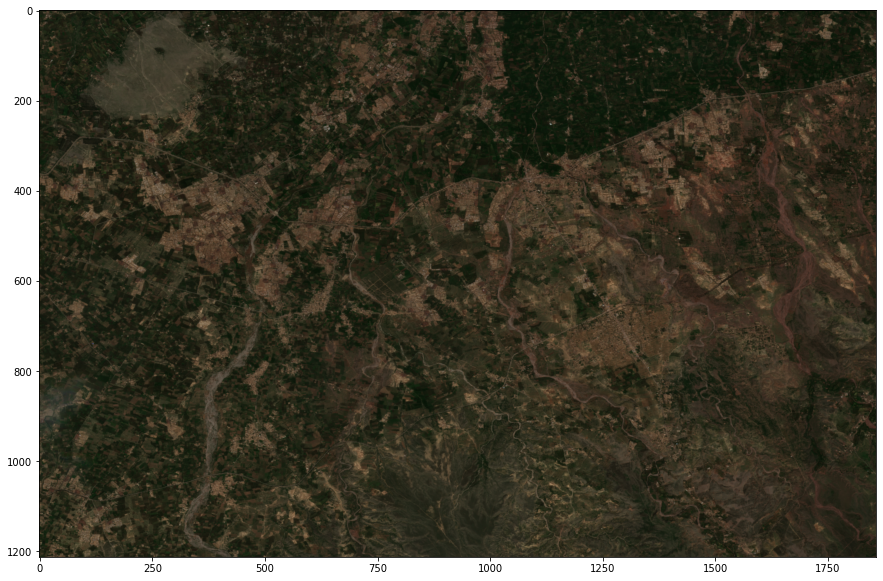

In [ ]:
plt.subplots(figsize=(15,15))
plt.imshow(rgb)

### NDVI

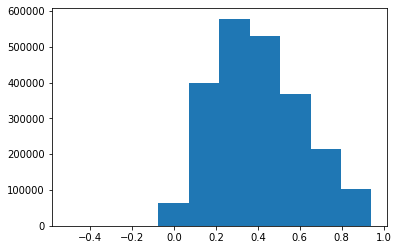

In [ ]:
plt.hist(ndvi.values.ravel());

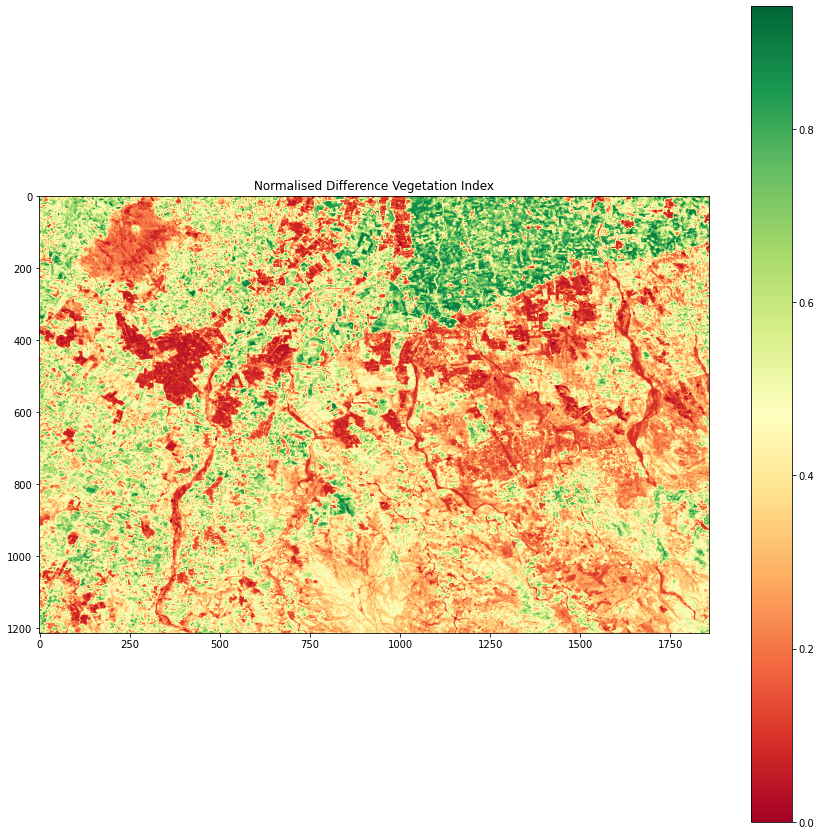

In [ ]:
plt.subplots(figsize=(15,15))
plt.imshow(ndvi, cmap='RdYlGn', vmin=0)
plt.title("Normalised Difference Vegetation Index")
plt.colorbar();

### NDWI

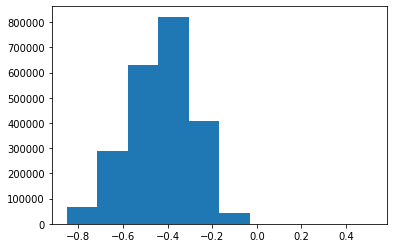

In [ ]:
plt.hist(ndwi.values.ravel());

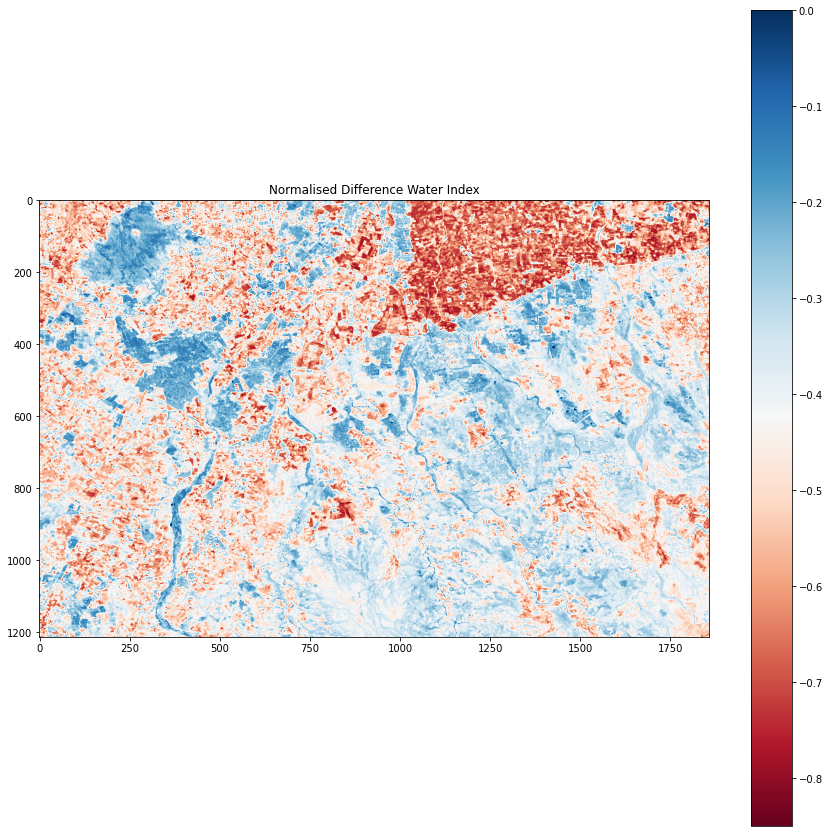

In [ ]:
plt.subplots(figsize=(15,15))
plt.title("Normalised Difference Water Index")
plt.imshow(ndwi, cmap="RdBu", vmax=0)
plt.colorbar();

### Digital Elevation Model

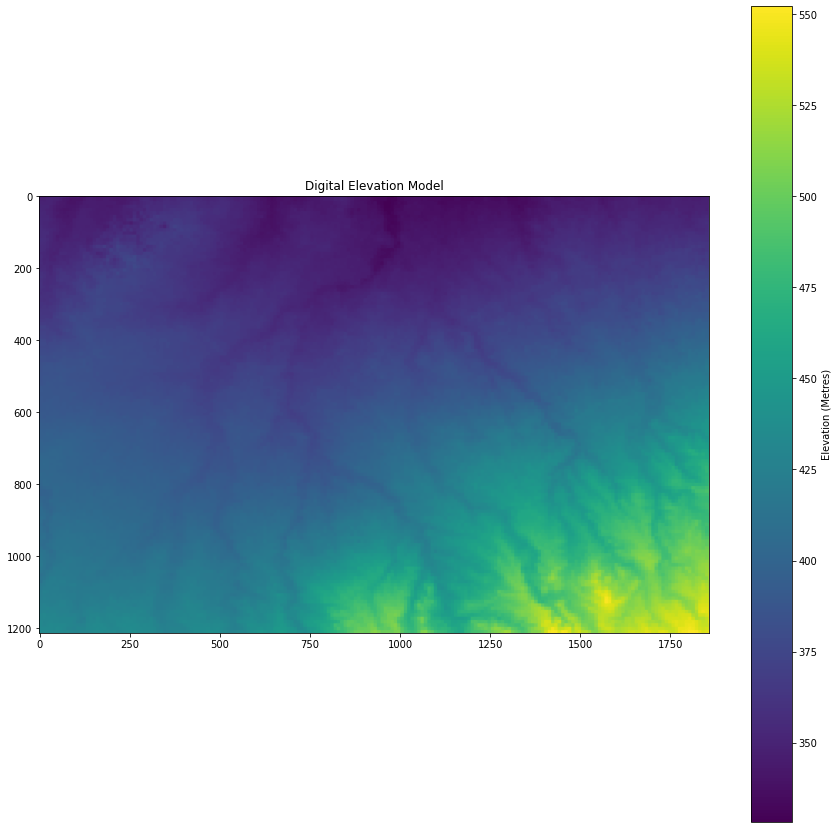

In [ ]:
plt.subplots(figsize=(15,15))
plt.title("Digital Elevation Model")
plt.imshow(dem_raster[0])
plt.colorbar().set_label('Elevation (Metres)')

## Plot images on interactive map using Folium

Interactive mapping of geospatial data can be done using the [folium](https://python-visualization.github.io/folium/) package.

Unfortunately Folium doesn't currently play well with colourmaps, which takes ages to run when used. Making custom colourmaps with branca used to work but appears to be currently bugged.

In [ ]:
%%time

# Obtains the georeferenced image bounds of the raster file and rearranges 
# them to be usable by folium.
lon_min, lat_min, lon_max, lat_max  = s2_raster.rio.bounds()
bounds = [
    [lat_min, lon_min], 
    [lat_max, lon_max]
]

# Specify image instances to be added to the interactive map.
RGB = folium.raster_layers.ImageOverlay(
    name="RGB Composite",
    image=rgb,
    bounds=bounds,
)

NDVI = folium.raster_layers.ImageOverlay(
    name="NDVI",
    image=ndvi.where(ndvi > 0).values,
    bounds=bounds,
    colormap=cm.RdYlGn,
    show=False,
)

# Folium appears to struggle with negative image values, therefore the absolute 
# value of the NDWI was taken and the colourmap was reversed to match the static 
# plot.
NDWI = folium.raster_layers.ImageOverlay(
    name="NDWI",
    image=abs(ndwi.where(ndwi < 0).values), 
    bounds=bounds,
    colormap=cm.RdBu_r,
    show=False,
)

DEM = folium.raster_layers.ImageOverlay(
    name="DEM",
    image=dem_raster[0].values,
    bounds=bounds,
    show=False,
)

CPU times: user 4min 56s, sys: 13.1 s, total: 5min 9s
Wall time: 4min 48s


In [ ]:
# Creates folium map instance centered on the Shamshato Refugee Camp.
m = folium.Map(
    location=[33.8792208601632, 71.712109868197], 
    zoom_start=13,
)

# Adds marker to the map highlighting the location of the Shamshato Refugee Camp.
folium.Marker(
    [33.8792208601632, 71.712109868197], 
    tooltip="Shamshato Refugee Camp"
).add_to(m)

# Adds image instances defined above to the map.
RGB.add_to(m)
NDVI.add_to(m)
NDWI.add_to(m)
DEM.add_to(m)

# Adds layer control function to allow the user to select between layers.
folium.LayerControl().add_to(m)

m